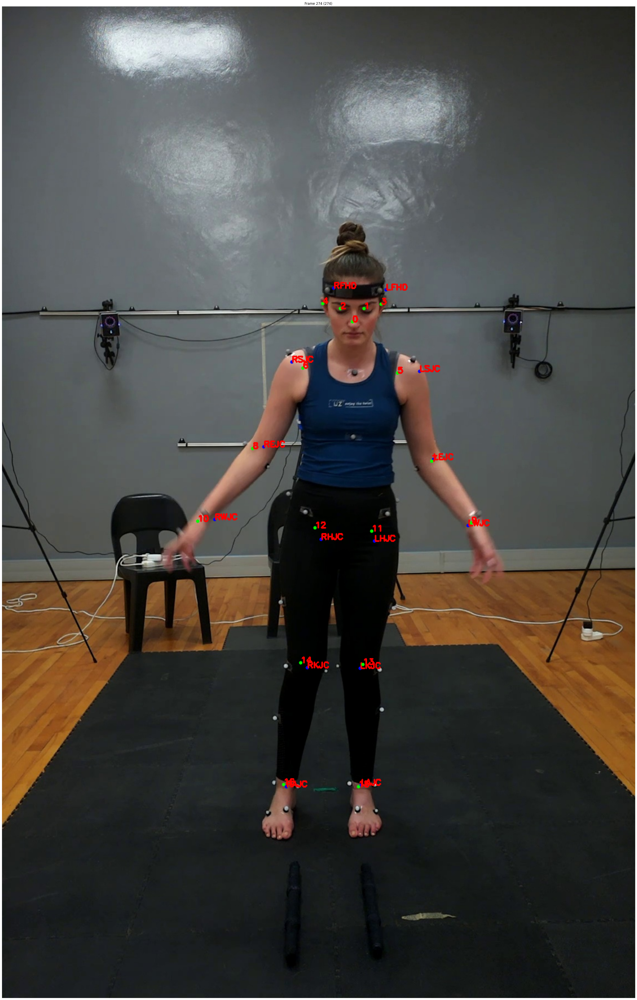

In [12]:
import json
import pandas as pd
from datetime import datetime
from fastprogress import progress_bar
import cv2
import matplotlib.pyplot as plt

root_path = 'path/to/data/'

# Load JSON and CSV data
with open(f'{root_path}data/stomp_sync_init.json', 'r') as f:
    stomp_sync_init_all = json.load(f)

with open(f'{root_path}data/stomp_3d_manual.json', 'r') as f:
    stomp_3d_manual = json.load(f)

stomp_sync_init_all = {
    "C1S1A6D2": stomp_sync_init_all['C1S1A6D2']
}

new_dict = {}

fig = plt.figure(figsize=(50, 50))

plot_idx = 0

for key, val in progress_bar(stomp_sync_init_all.items(), total=len(stomp_sync_init_all)):
    first_idx_w_drop = val['first_idx_w_drop']
    last_idx_w_drop = val['last_idx_w_drop']
    first_idx = val['first_idx']
    last_idx = val['last_idx']
    combination = key
    group_id = key[2:]
    cam = key[:2]
    subject = f"{group_id.split('A')[0]}"
    if cam == 'C4':
        continue
    c4_start_idx = stomp_3d_manual[f'C4{group_id}']['first_idx']
    internal_path = f'{root_path}internal_data/{cam}/{subject}/{group_id}.json'
    with open(internal_path, 'r') as f:
        internal_frames = json.load(f)
    yolo_path = f'{root_path}data/data_yolo/frames/{cam}/{subject}/{combination}.json'
    with open(yolo_path, 'r') as f:
        yolo_frames = json.load(f)
    internal_frames = internal_frames[c4_start_idx:c4_start_idx+1]
    yolo_frames = yolo_frames[first_idx:first_idx+1]
    idxs = [i for i in range(first_idx, first_idx+1)]
    for i, (internal_frame, yolo_frame, idx) in enumerate(zip(internal_frames, yolo_frames, idxs)):
        img_path = f'{root_path}frames/{cam}/{subject}/{combination}/{combination}_{str(idx).zfill(4)}.jpg'
        internal_points = internal_frame['point_ids']
        internal_xy = internal_frame['xy']
        yolo_xy = yolo_frame['keypoints'][0][0]
        yolo_xy = [coord[:2] for coord in yolo_xy]
        
        # Plot points on image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        for point, point_id in zip(internal_xy, internal_points):
            try:
                if point_id not in ['LFHD', 'RFHD', 'LSJC', 'RSJC', 'LEJC', 'REJC', 'LWJC', 'RWJC', 'LHJC', 'RHJC', 'LKJC', 'RKJC', 'LAJC', 'RAJC']:
                    continue
                x, y = point
                cv2.circle(image, (int(x), int(y)), 3, (0, 0, 255), -1)
                cv2.putText(image, str(point_id), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
            except:
                continue
        for i, point in enumerate(yolo_xy):
            x, y = point
            cv2.circle(image, (int(x), int(y)), 3, (0, 255, 0), -1)
            cv2.putText(image, str(i), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        # Plot single image just one, no axis NOOOO AXIS
        plt.imshow(image)
        plt.axis('off')
        plt.title(f'Frame {idx} ({first_idx})')

        plot_idx += 1
        
        if plot_idx >= 8:  # Only plot 8 images
            break

    if plot_idx >= 8:
        break

plt.tight_layout()
plt.show()

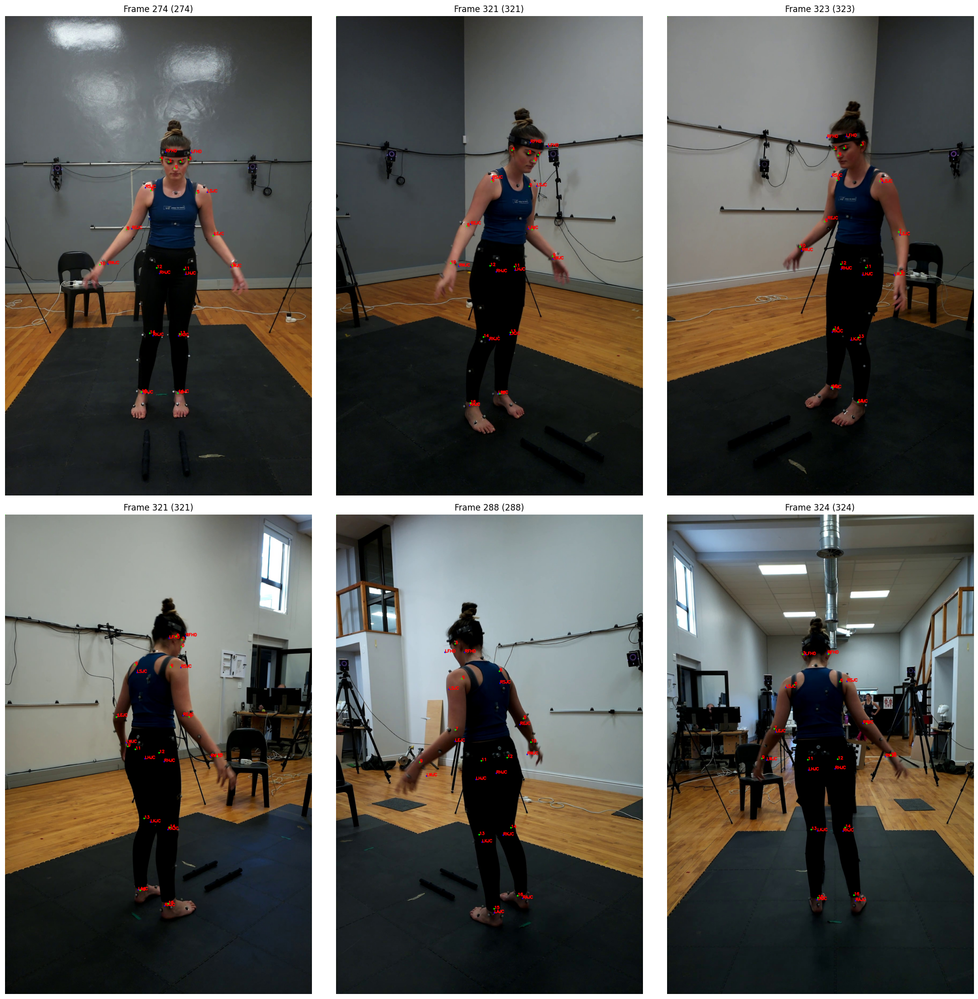

In [15]:
import json
import pandas as pd
from datetime import datetime
from fastprogress import progress_bar
import cv2
import matplotlib.pyplot as plt

# Load JSON and CSV data
with open(f'{root_path}data/stomp_sync_init.json', 'r') as f:
    stomp_sync_init_all = json.load(f)

with open(f'{root_path}data/stomp_3d_manual.json', 'r') as f:
    stomp_3d_manual = json.load(f)

stomp_sync_init_all = {
    "C1S1A6D2": stomp_sync_init_all['C1S1A6D2'],
    "C2S1A6D2": stomp_sync_init_all['C2S1A6D2'],
    "C3S1A6D2": stomp_sync_init_all['C3S1A6D2'],
    "C4S1A6D2": stomp_sync_init_all['C4S1A6D2'],
    "C5S1A6D2": stomp_sync_init_all['C5S1A6D2'],
    "C6S1A6D2": stomp_sync_init_all['C6S1A6D2'],
}

new_dict = {}

fig, axs = plt.subplots(2, 3, figsize=(20, 20))

plot_idx = 0

for key, val in progress_bar(stomp_sync_init_all.items(), total=len(stomp_sync_init_all)):
    first_idx_w_drop = val['first_idx_w_drop']
    last_idx_w_drop = val['last_idx_w_drop']
    first_idx = val['first_idx']
    last_idx = val['last_idx']
    combination = key
    group_id = key[2:]
    cam = key[:2]
    subject = f"{group_id.split('A')[0]}"
    # if cam == 'C4':
    #     continue
    c4_start_idx = stomp_3d_manual[f'C4{group_id}']['first_idx']
    internal_path = f'{root_path}internal_data/{cam}/{subject}/{group_id}.json'
    with open(internal_path, 'r') as f:
        internal_frames = json.load(f)
    yolo_path = f'{root_path}data/data_yolo/frames/{cam}/{subject}/{combination}.json'
    with open(yolo_path, 'r') as f:
        yolo_frames = json.load(f)
    internal_frames = internal_frames[c4_start_idx:c4_start_idx+1]
    yolo_frames = yolo_frames[first_idx:first_idx+1]
    idxs = [i for i in range(first_idx, first_idx+1)]
    for i, (internal_frame, yolo_frame, idx) in enumerate(zip(internal_frames, yolo_frames, idxs)):
        img_path = f'{root_path}frames/{cam}/{subject}/{combination}/{combination}_{str(idx).zfill(4)}.jpg'
        internal_points = internal_frame['point_ids']
        internal_xy = internal_frame['xy']
        yolo_xy = yolo_frame['keypoints'][0][0]
        yolo_xy = [coord[:2] for coord in yolo_xy]
        
        # Plot points on image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        for point, point_id in zip(internal_xy, internal_points):
            try:
                if point_id not in ['LFHD', 'RFHD', 'LSJC', 'RSJC', 'LEJC', 'REJC', 'LWJC', 'RWJC', 'LHJC', 'RHJC', 'LKJC', 'RKJC', 'LAJC', 'RAJC']:
                    continue
                x, y = point
                cv2.circle(image, (int(x), int(y)), 3, (0, 0, 255), -1)
                cv2.putText(image, str(point_id), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
            except:
                continue
        for i, point in enumerate(yolo_xy):
            x, y = point
            cv2.circle(image, (int(x), int(y)), 3, (0, 255, 0), -1)
            cv2.putText(image, str(i), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        if plot_idx < axs.size:
            axs = axs.flatten()  # Flatten the 2D array of axes
            axs[plot_idx].imshow(image)
            axs[plot_idx].axis('off')
            axs[plot_idx].set_title(f'Frame {idx} ({first_idx})')
            plot_idx += 1
        else:
            print("Exceeded the number of subplots.")
        
# Give title to the figure
plt.tight_layout()
plt.show()


In [10]:
import cv2
import json
import numpy as np
from fastprogress import progress_bar

for cam in ['C1', 'C2', 'C3', 'C4', 'C5', 'C6']:
# for cam in ['C4']:

    # Load the frames from the JSON file
    with open(f'{root_path}internal_data/{cam}/S1/S1A3D1.json', 'r') as f:
        frames = json.load(f)

    # Check if there are any frames
    if not frames:
        raise ValueError("No frames found in the JSON file.")

    # Get the path of the first image
    first_frame_path = frames[0]['path']
    first_frame_path = f'{root_path}{first_frame_path}'

    # Read the first image to get its shape
    first_img = cv2.imread(first_frame_path)
    if first_img is None:
        raise ValueError(f"Error loading the first image: {first_frame_path}")

    # Get image shape (height, width, channels)
    frame_height, frame_width, _ = first_img.shape
    frame_size = (frame_width, frame_height)

    # Define the video writer
    fps = 30  # Frames per second
    video_filename = f'{root_path}data/sync_test_{cam}b.mp4'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for MP4 file
    video_writer = cv2.VideoWriter(video_filename, fourcc, fps, frame_size)

    for frame in progress_bar(frames):
        path = frame['path']
        path = f'{root_path}{path}'
        xy = frame['xy']
        factor = frame['factor']
        dup_num = frame['dup_num']
        # if factor != dup_num:
        #     continue
        
        # Read the image
        img = cv2.imread(path)
        if img is None:
            print(f"Error loading image: {path}")
            continue
        
        # Resize image if needed (to match frame_size)
        img = cv2.resize(img, frame_size)

        # Plot the xy values on the image
        for (x, y) in xy:
            try:
                cv2.circle(img, (int(x), int(y)), 5, (0, 255, 0), -1)  # Green circle with radius 5
            except:
                continue

        # Write the frame to the video file
        video_writer.write(img)

    # Release the video writer
    video_writer.release()
    print(f"Video saved as {video_filename}")


Video saved as data_stomps/sync_test_C1b.mp4


Video saved as data_stomps/sync_test_C2b.mp4


Video saved as data_stomps/sync_test_C3b.mp4


Video saved as data_stomps/sync_test_C4b.mp4


Video saved as data_stomps/sync_test_C5b.mp4


Video saved as data_stomps/sync_test_C6b.mp4


In [12]:
import cv2
import json
import plotly.graph_objs as go
import plotly.offline as pyo

file = f'{root_path}WCS/S13/S13A1D1.json'

cam = file.split('/')[-3]
subject = file.split('/')[-2]
combination = file.split('/')[-1].split('.')[0]

# Load the frames from the JSON file
with open(file, 'r') as f:
    frames = json.load(f)

internal_frame = frames[0]

# Get coordinates and IDs from the JSON file
internal_points = internal_frame['point_ids']
internal_xy = internal_frame['xyz']

# Get coords from xyz
x_coords = [coord[0] for coord in internal_xy]
y_coords = [coord[1] for coord in internal_xy]
z_coords = [coord[2] for coord in internal_xy]
ids = [ids_map[point_id] for point_id in internal_points]

# Create a 3D scatter plot for points
trace_points = go.Scatter3d(
    x=x_coords,
    y=y_coords,
    z=z_coords,
    mode='markers+text',
    text=ids,
    textposition='top center',
    marker=dict(size=3, color='blue')
)

# Prepare data for lines
x_lines = []
y_lines = []
z_lines = []

for point1, point2 in connections:
    index1 = ids.index(point1)
    index2 = ids.index(point2)

    # Add the coordinates for point1
    x_lines.extend([x_coords[index1], x_coords[index2], None])
    y_lines.extend([y_coords[index1], y_coords[index2], None])
    z_lines.extend([z_coords[index1], z_coords[index2], None])

# Create a trace for the lines
trace_lines = go.Scatter3d(
    x=x_lines,
    y=y_lines,
    z=z_lines,
    mode='lines',
    line=dict(color='black', width=2)
)

# Layout for the plot with axis ranges
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='X (mm)', range=[-1000, 1000]),  # Set range for x-axis
        yaxis=dict(title='Y (mm)', range=[-10, 2000]),    # Set range for y-axis
        zaxis=dict(title='Z (mm)', range=[-1000, 1000]),  # Set range for z-axis
    ),
    title='3D Scatter Plot of Body Points with Connections',
    showlegend=False
)

# Create the figure with both points and lines
fig = go.Figure(data=[trace_points, trace_lines], layout=layout)

# Automatically display the plot in the default web browser
pyo.plot(fig, auto_open=True)


'temp-plot.html'

In [46]:
import json
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
from moviepy.editor import ImageSequenceClip
from tqdm import tqdm
from PIL import Image
from glob import glob

import cv2
import numpy as np
import os
from tqdm import tqdm
from PIL import Image
from glob import glob

# Define paths
path = f'{root_path}WCS/S4/S4A1D2.json'

# Load frames from JSON
with open(path, 'r') as f:
    frames = json.load(f)

# Directory to store the frames as images
output_dir = f'{root_path}data/frames_video_temp'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Number of frames
num_frames = len(frames)

image_files = []

# Set up figure and 3D axis
for cnt in tqdm(range(num_frames), desc="Rendering frames"):
    # if cnt == 50:  # Limiting to 50 frames for testing
    #     break

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.clear()
    
    # Extract the xyz data
    frame = frames[cnt]
    xyz = frame['xyz']
    points_skel = np.array(xyz)
    
    # Plot points
    ax.scatter(points_skel[:, 0], points_skel[:, 2], points_skel[:, 1], c='b', marker='o', s=3, alpha=1)
    
    # Set axis labels and limits
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    ax.set_xlim([-900, 900])  # Adjust limits based on your data
    ax.set_ylim([-900, 900])
    ax.set_zlim([-60, 1800])
    
    ax.set_title(f'Frame {cnt+1}/{num_frames}')
    
    # Save the frame as an image file
    frame_filename = f"{output_dir}/frame_{cnt:04d}.png"
    plt.savefig(frame_filename)
    image_files.append(frame_filename)
    plt.close()

# Validate image files
valid_images = []
for img_file in image_files:
    try:
        # Try opening the image with PIL
        img = Image.open(img_file)
        img.verify()  # Check if image is readable
        valid_images.append(img_file)
    except (IOError, SyntaxError) as e:
        print(f"Corrupted or unreadable image file: {img_file}. Error: {e}")

if not valid_images:
    raise ValueError("No valid image files after verification.")
else:
    print(f"Verified {len(valid_images)} valid images for video creation.")

# Parameters
fps = 15
frame_size = None

# Get the size of the images for video creation
if valid_images:
    img = cv2.imread(valid_images[0])
    frame_size = (img.shape[1], img.shape[0])  # (width, height)

    # Create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 files
    out = cv2.VideoWriter(f'{root_path}data/3d_animation_15fps.mp4', fourcc, fps, frame_size)

    for img_file in valid_images:
        img = cv2.imread(img_file)
        out.write(img)  # Write the frame to the video

    out.release()  # Finalize the video file
    print("Video creation successful.")
else:
    print("No valid frames to create a video.")


Rendering frames: 100%|██████████| 1334/1334 [02:08<00:00, 10.41it/s]


Verified 1334 valid images for video creation.
Video creation successful.
